# Analyzing Bechdel test results using TMDB data : 
# gender of the main character on the poster

We push forward the task initiated in `4. Analyzing gender representation in posters with Computer Vision` and investigate to what extent the gender of the main character on the movie posters depend on the Bechdel ratings.

## Import packages

In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm

import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec
%matplotlib inline

In [2]:
# For developers who want to use the latest development version or the library locally
# Use poetry to install dependencies
import sys
sys.path.append("../") # Or change to the folder to the direction of the working directory

%load_ext autoreload
%autoreload 2

import bechdelai

## Import matched Bechdeltest / TMDB data from csv files
The fetching and matching steps have already been done in the tutorial `BechdelAI tutorial #3 - Analyzing Bechdel test results using TMDB data`. Here, we import data from json files created at the end of this notebook (actually in the original version of this tutorial, csv files were created but this raises some issues I cannot get rid of easily, e.g. lists are transformed to strings. That's why I switched to the json format). 

In [3]:
path = "Bechdel_TMDB_data/"       # Enter the path to the csv files
metadata = pd.read_json(path + "bechdel_movies_metadata.json")

pd.set_option('display.max_columns', None)
metadata.head(2)

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,bechdel_rating,count
0,False,/6vYffq6NoneNmNPp6IsobnnlrHS.jpg,None,0,"[{'id': 99, 'name': 'Documentary'}]",,315946,tt3155794,fr,Passage de Venus,Photo sequence of the rare transit of Venus ov...,4.509,/XWPDZzK7N2WQcejI8W96IxZEeP.jpg,[],"[{'iso_3166_1': 'FR', 'name': 'France'}]",1874-12-09,0,1,"[{'english_name': 'No Language', 'iso_639_1': ...",Released,,Passage of Venus,False,6.2,80,0,1
1,False,None,None,0,"[{'id': 16, 'name': 'Animation'}]",,766094,tt14495706,xx,La Rosace Magique,Praxinoscope strip of a shifting rosette. Seri...,1.011,/5zeVMAp3R4QHGarSc4Bf3B1uBY2.jpg,[],"[{'iso_3166_1': 'FR', 'name': 'France'}]",1878-05-07,0,1,"[{'english_name': 'No Language', 'iso_639_1': ...",Released,,The Magic Rosette,False,6.0,13,0,1


Note : some movies have no poster e.g.

In [4]:
metadata[metadata['id']==60246]

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,bechdel_rating,count
5905,False,None,None,0,"[{'id': 35, 'name': 'Comedy'}, {'id': 10402, '...",,60246,tt1326221,en,Fruit Fly,Filipina performance artist Bethesda moves int...,0.6,None,[],[],2009-09-28,0,94,[],Released,,Fruit Fly,False,4.3,6,3,1


## Basic pre-processing

Add a column for the release year

In [5]:
metadata['release_date'] = pd.to_datetime(metadata['release_date'])
metadata['release_year'] = metadata['release_date'].dt.year
metadata.head(2)

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,bechdel_rating,count,release_year
0,False,/6vYffq6NoneNmNPp6IsobnnlrHS.jpg,None,0,"[{'id': 99, 'name': 'Documentary'}]",,315946,tt3155794,fr,Passage de Venus,Photo sequence of the rare transit of Venus ov...,4.509,/XWPDZzK7N2WQcejI8W96IxZEeP.jpg,[],"[{'iso_3166_1': 'FR', 'name': 'France'}]",1874-12-09,0,1,"[{'english_name': 'No Language', 'iso_639_1': ...",Released,,Passage of Venus,False,6.2,80,0,1,1874.0
1,False,None,None,0,"[{'id': 16, 'name': 'Animation'}]",,766094,tt14495706,xx,La Rosace Magique,Praxinoscope strip of a shifting rosette. Seri...,1.011,/5zeVMAp3R4QHGarSc4Bf3B1uBY2.jpg,[],"[{'iso_3166_1': 'FR', 'name': 'France'}]",1878-05-07,0,1,"[{'english_name': 'No Language', 'iso_639_1': ...",Released,,The Magic Rosette,False,6.0,13,0,1,1878.0


Keep only relevant features

In [6]:
metadata = metadata[['genres', 'id', 'original_title', 'release_year', 'bechdel_rating']]

# Explode the graph by the list of genres and get genre name
def get_name(dic):
    if isinstance(dic, dict):
        return dic['name']
    else:
        return dic
    
metadata = metadata.explode("genres")
metadata['genres'] = metadata['genres'].apply(get_name) 



In [7]:
metadata.head()

,genres,id,original_title,release_year,bechdel_rating
0,Documentary,315946,Passage de Venus,1874.0,0
1,Animation,766094,La Rosace Magique,1878.0,0
2,Animation,194079,Sallie Gardner at a Gallop,1878.0,0
2,Documentary,194079,Sallie Gardner at a Gallop,1878.0,0
3,Animation,751212,Le Singe Musicien,1878.0,0


## Choose movies

Choose movies released in 2022 that are not animation movies

In [8]:
metadata_select = metadata[metadata['release_year']==2022]
animation_ids = metadata_select[metadata_select['genres']=='Animation']['id'].tolist()
metadata_select = metadata_select[-metadata_select['id'].isin(animation_ids)]
# Drop the column 'genres', we don't need it anymore
metadata_select = metadata_select.drop("genres", axis = 1)
metadata_select = metadata_select.drop_duplicates()

In [9]:
metadata_select.isna().sum(axis = 0)

id                0
original_title    0
release_year      0
bechdel_rating    0
dtype: int64

## Download all posters 

To be run only once (of course no need to re-download the posters if already done)

In [10]:
poster_folder = "posters_2022/"     # choose where to store the posters

In [11]:
from bechdelai.data.tmdb import TMDB

In [12]:
'''
movie_select_ids = metadata_select['id'].tolist()

# tmdb = TMDB(api_key = "XXXXXXX") #replace here with your API_KEY
# If you don't pass an API key, the TMDB class will look for one TMDB_API_KEY in an .env file
# So if you have a .env file configured, you can instantiate the TMDB client with the simple function
tmdb = TMDB()
tmdb.download_all_posters(movie_select_ids, poster_folder)
'''

'\nmovie_select_ids = metadata_select[\'id\'].tolist()\n\n# tmdb = TMDB(api_key = "XXXXXXX") #replace here with your API_KEY\n# If you don\'t pass an API key, the TMDB class will look for one TMDB_API_KEY in an .env file\n# So if you have a .env file configured, you can instantiate the TMDB client with the simple function\ntmdb = TMDB()\ntmdb.download_all_posters(movie_select_ids, poster_folder)\n'

## Poster analysis

In [13]:
from PIL import Image

In [14]:
from bechdelai.image.face_detection import FacesDetector
from bechdelai.image.gender_detection import GenderDetector
from bechdelai.image.clip import CLIP

In [15]:
fd = FacesDetector()
gd = GenderDetector()

Loading CLIP model


In [16]:
# Function that returns all infos extracted by poster analysis
# for the posters with ids in the list movie_ids and with poster images stored in poster_folder
def posters_analysis(movie_ids, poster_folder = "posters_2022/"):
    all_probas = pd.DataFrame()
    for movie_id in tqdm(movie_ids):    # loop on movies
        # open the poster
        poster_path = poster_folder + str(movie_id) + ".png"
        poster = Image.open(poster_path) 
        # convert to RGB 
        # (Input images need to have 3 channels for get_image in retinaface/RetinaFace.py)
        if poster.mode=='L':
            poster = poster.convert('RGB')
        # detect the faces
        rois, faces = fd.detect(np.array(poster), method = "retinaface", padding = 20)
        # close the poster
        poster.close()
        # predict the genders
        try:   # if faces can be detected
            probas = gd.predict(faces)
            # complete the dataframe `probas` containing results for one movie
            probas['id'] = movie_id
            probas['rois'] = pd.Series([{'face_'+str(idx+1): rois['face_'+str(idx+1)]} for idx in probas.index.tolist()])
        except:  #if faces cannot be detected
            column_names = ['man', 'woman', 'diff', 'gender', 'area', 'area_percentage_relative', 'id', 'rois']
            probas = pd.DataFrame(columns = column_names, index=[0])   # empty dataframe
            probas['id'] = movie_id
            probas['gender'] = 'no face'
        # update the dataframe `all_probas` containing results for all movies
        all_probas = pd.concat([all_probas, probas], axis = 0)
       
        
    return all_probas


# Function that adds to the input dataframe containing only metadata infos
# some columns containing the gender of the MAIN character on the movie poster (and other poster analysis infos) 
def add_poster_analysis(dataframe, poster_folder = "posters_2022/"):
    # Get movie ids
    movie_ids = dataframe['id'].tolist()
    # Perform the complete poster analysis
    all_probas_df = posters_analysis(movie_ids, poster_folder = poster_folder)
    #Merge results with the dataframe
    dataframe = dataframe.merge(all_probas_df, on = "id", how = 'left')
    # For each movie, keep only infos about the main character on the poster 
    # (i.e the character with the largest face area)
    dataframe = (dataframe
                 .sort_values(by = ['id', 'area'], ascending = False)
                 .groupby('id')
                 .head(1)
                )
    
    return all_probas_df, dataframe



#### Optional : show all infos extracted from poster analysis on a few posters
Note that the movie with id=788921 has no detected faces

In [17]:
# Run poster analysis
movie_ids = [579974, 619730, 788921]
all_probas = posters_analysis(movie_ids)

# Show 
pd.set_option('display.max_columns', None)
display(all_probas)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:14<00:00,  4.90s/it]


,man,woman,diff,gender,area,area_percentage_relative,id,rois
0,0.963363,0.036637,0.926725,man,317504,0.334274,579974,"{'face_1': {'score': 0.999738872051239, 'facia..."
1,0.976153,0.023847,0.952306,man,260631,0.274397,579974,"{'face_2': {'score': 0.9993860721588135, 'faci..."
2,0.070068,0.929932,0.859864,woman,98736,0.103951,579974,"{'face_3': {'score': 0.9993718266487122, 'faci..."
3,0.990794,0.009206,0.981588,man,69768,0.073453,579974,"{'face_4': {'score': 0.9980438947677612, 'faci..."
4,0.916439,0.083561,0.832878,man,139536,0.146906,579974,"{'face_5': {'score': 0.9978998899459839, 'faci..."
5,0.994355,0.005645,0.988709,man,63656,0.067018,579974,"{'face_6': {'score': 0.9935625791549683, 'faci..."
0,0.203073,0.796927,0.593853,woman,18788,1.000000,619730,"{'face_1': {'score': 0.9801728129386902, 'faci..."
0,NaN,NaN,NaN,no face,NaN,NaN,788921,NaN


#### Run poster analysis for all selected movies

In [18]:
_, metadata_select = add_poster_analysis(metadata_select, poster_folder = poster_folder)

100%|████████████████████████████████████████████████████████████████████████████████| 130/130 [06:58<00:00,  3.22s/it]


Save results

In [19]:
metadata_select.to_pickle("metadata_select_2022_noanim.pkl")

## Show posters

Load results

In [20]:
metadata_select = pd.read_pickle("metadata_select_2022_noanim.pkl")

In [21]:
metadata_select.isna().sum(axis = 0)

id                           0
original_title               0
release_year                 0
bechdel_rating               0
man                         21
woman                       21
diff                        21
gender                       0
area                        21
area_percentage_relative    21
rois                        21
dtype: int64

Movies for which no faces has been detected on the poster

In [22]:
metadata_select[metadata_select.isna().any(axis = 1)]

,id,original_title,release_year,bechdel_rating,man,woman,diff,gender,area,area_percentage_relative,rois
328,928344,Weird: The Al Yankovic Story,2022.0,1,NaN,NaN,NaN,no face,NaN,NaN,NaN
247,852046,Athena,2022.0,2,NaN,NaN,NaN,no face,NaN,NaN,NaN
246,848685,As bestas,2022.0,3,NaN,NaN,NaN,no face,NaN,NaN,NaN
358,843932,Nanny,2022.0,3,NaN,NaN,NaN,no face,NaN,NaN,NaN
199,838330,Not Okay,2022.0,3,NaN,NaN,NaN,no face,NaN,NaN,NaN
243,830788,The Invitation,2022.0,3,NaN,NaN,NaN,no face,NaN,NaN,NaN
172,819309,Emergency,2022.0,3,NaN,NaN,NaN,no face,NaN,NaN,NaN
273,817758,TÁR,2022.0,3,NaN,NaN,NaN,no face,NaN,NaN,NaN
322,791333,El cuarto pasajero,2022.0,0,NaN,NaN,NaN,no face,NaN,NaN,NaN
6,788921,Everything Will Change,2022.0,0,NaN,NaN,NaN,no face,NaN,NaN,NaN


In [23]:
from bechdelai.image.utils import show_faces_on_image, show_all_faces

In [24]:
# Function that displays all posters of movies in res_df
# and shows frames around faces if faces are detected
# This is slow ...
def show_posters_with_main_face(res_df, 
                                poster_folder = "posters_2022/", 
                                figsize = [12, 10],     # Size of the figure [width, height]
                                n_cols = 6,         # Number of columns in the plot
                                wspace = 0.05,  # amount of width reserved for space between subplots (in %)
                                hspace = 0.2,    # amount of height reserved for space between subplots (in %),
                                title = 'rating',   # title category
                                fontsize = 8      # fontsize for titles
                               ):
     # Get the list of movie ids
    movie_ids = res_df['id'].tolist()
    
    # Initialize the figure
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(len(movie_ids)//n_cols+1, n_cols, wspace=wspace, hspace=hspace, figure=fig)
    row_val = 0        # Index to count rows in the plot
    
    # Loop on movies
    for idx, movie_id in enumerate(movie_ids):    
        # open the poster
        poster_path = poster_folder + str(movie_id) + ".png"
        poster = Image.open(poster_path) 
        
        # Get relevant infos
        rois, gender, bechdel_rating, year = res_df[res_df['id']==movie_id][['rois', 'gender', 'bechdel_rating', 'release_year']].values[0]
        
        # Show the poster with the main face and the bechdel rating
        try:      # if faces have been detected on the poster
            img_with_faces = show_faces_on_image(poster, rois, width = 10, genders = [gender])
            #face_colors = {'man': (0, 0, 255), 'woman': (255,192,203)}
            #img_with_faces = show_faces_on_image(poster, rois, width = 10, color = face_colors[gender]) 
            #img_with_faces = img_with_faces.resize((100,150))
        except:
            img_with_faces = poster
        
        ax = fig.add_subplot(gs[row_val, idx%n_cols])
        ax.imshow(img_with_faces)
        if title=='rating':
            ax.set_title("Bechdel rating = "+str(bechdel_rating), fontsize = fontsize)
        elif title=='year':
            ax.set_title("Release year = "+str(int(year)), fontsize = fontsize)
        elif title=='none':
            pass
        else:
            raise ValueError("Unknown title category")
        ax.set_axis_off()
        if (idx+1)%n_cols==0: 
            row_val = row_val + 1 


Show posters on which no face has been detected

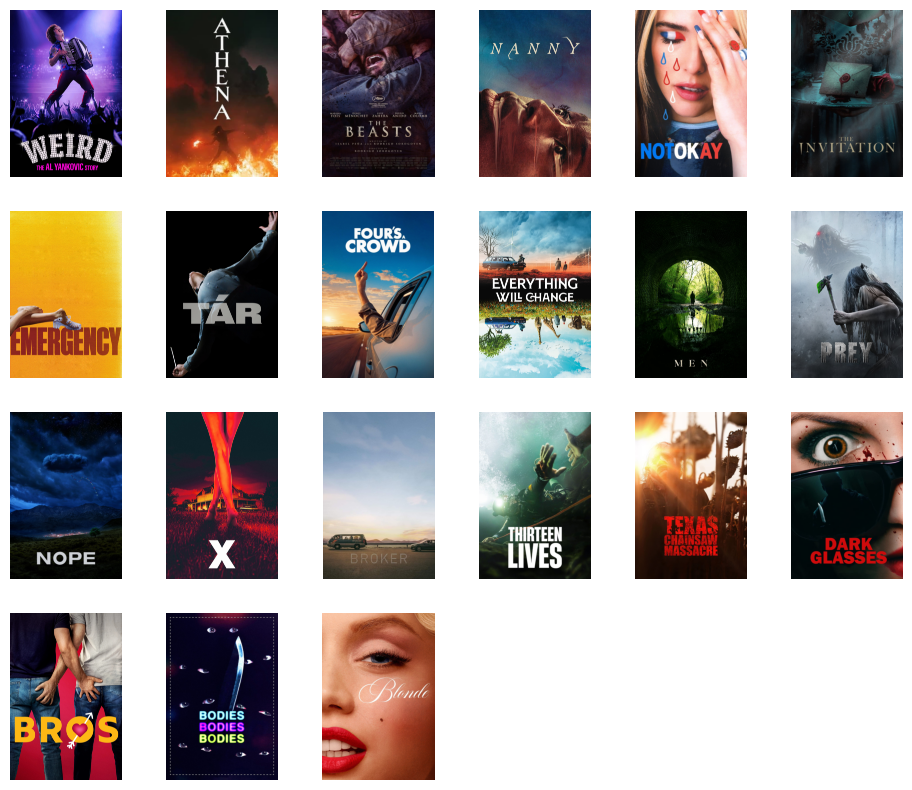

In [25]:
show_posters_with_main_face(metadata_select[metadata_select.isna().any(axis = 1)], title = 'none')

Show posters with unknown gender

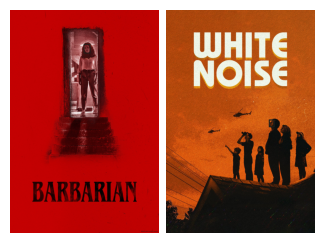

In [26]:
show_posters_with_main_face(metadata_select[metadata_select['gender']=='unknown'], title='none')

Show all posters

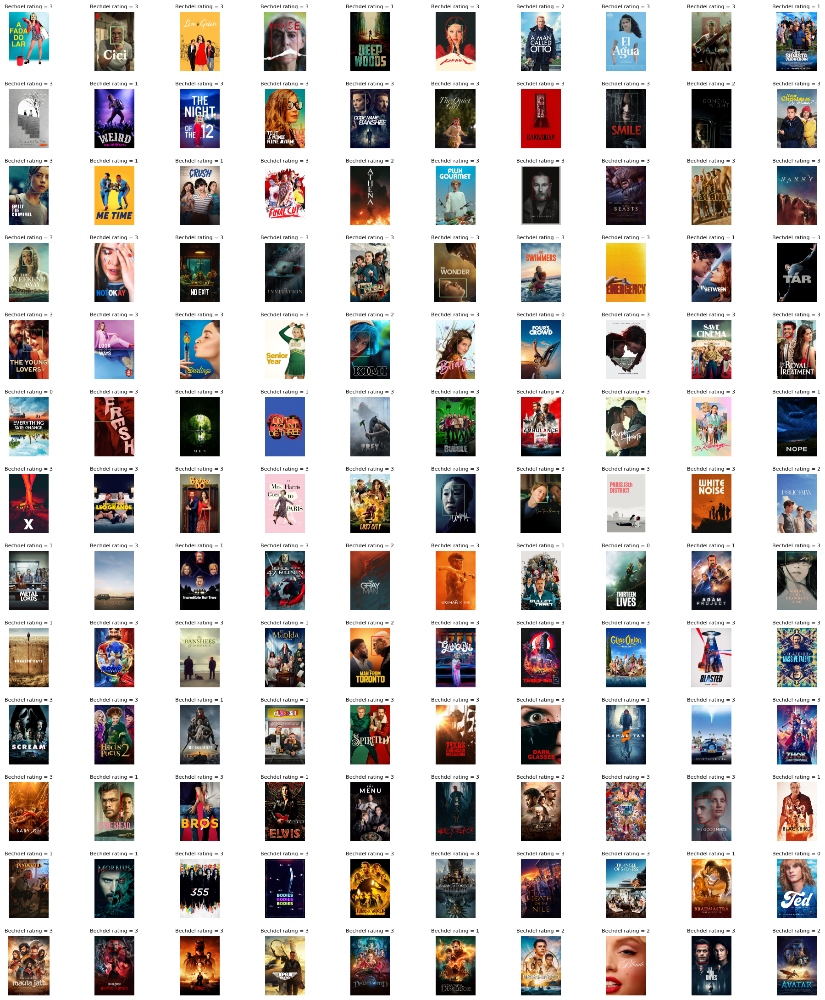

In [52]:
show_posters_with_main_face(metadata_select, figsize = [24, 30], n_cols = 10, wspace = 0.002, hspace = 0.3)
#show_posters_with_main_face(metadata_select, figsize = [12, 16], n_cols = 6, wspace = 0, hspace = 0, title='none')

Study gender repartition

In [28]:
data = metadata_select[['id', 'gender']]
data = data.groupby('gender').count().reset_index()

fig = px.pie(
    data,
    values = "id",
    names = "gender",
    color_discrete_sequence = px.colors.qualitative.Pastel,  #[px.colors.qualitative.Pastel[i] for i in [5, 6]]
    category_orders = {"gender": ['man', 'woman', 'unknown', 'no face']},
    labels = {"gender": "Gender of the main character"},
    height = 400,
)

# center the title
fig.update_layout(title_text='Gender of the main character on 130 posters<br>'
                  +'of (no animation) movies released in 2022<br>',
                  #+'(source: bechdeltest.com & IMDB)', 
                  title_x=0.5,
                  title_y=0.95,
                  title_xanchor = 'center',
                  title_yanchor = 'top'
                 )       

fig.show()

Same with other graphical chart

In [29]:
palette_1 = [
    "#ffb46a",
    "#f8ed78",
    "#acef9f",
    "#65e986",
    "#69efc2",
]

palette_2 = [
    "#b094df",  # Man
    "#99dc8d",  # Woman
]

palette_3 = [
    "#b094df",  # Man
    "#b5f0ff", # Non binary
    "#99dc8d",  # Woman
]

palette_4 = [
    "#b094df",  # Man
    "#99dc8d",  # Woman
    "#b5f0ff", # Unknown
    "#ffb46a",   # no face
]

In [30]:
data = metadata_select[['id', 'gender']]
data = data.groupby('gender').count().reset_index()

fig = px.pie(
    data,
    values = "id",
    names = "gender",
    color_discrete_sequence = palette_4,
    category_orders = {"gender": ['man', 'woman', 'unknown', 'no face']},
    labels = {"gender": "Gender of the main character"},
    height = 400,
)

# center the title
fig.update_layout(title_text='Gender of the main character on 130 posters<br>'
                  +'of (no animation) movies released in 2022<br>',
                  #+'(source: bechdeltest.com & IMDB)', 
                  title_x=0.5,
                  title_y=0.95,
                  title_xanchor = 'center',
                  title_yanchor = 'top',
                  font=dict(family="Poppins, sans-serif", size=15),
                  plot_bgcolor="rgba(0, 0, 0, 0)",
                  xaxis=dict(showgrid=True),
                  yaxis=dict(showgrid=True),
                 )   



fig.show()

# This requires to install kaleido (that is not in the default bechdelai poetry environment)
path = "bechdeltest_tmdb_analysis_figs/poster_analysis/"
fig.write_image(path + "poster_analysis_pie_2022.svg", width = 600, height = 400)

## Study correlations between the Bechdel rating and the gender of the main character on the poster

In [31]:
metadata_select.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 130 entries, 267 to 341
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        130 non-null    int64  
 1   original_title            130 non-null    object 
 2   release_year              130 non-null    float64
 3   bechdel_rating            130 non-null    int64  
 4   man                       109 non-null    float32
 5   woman                     109 non-null    float32
 6   diff                      109 non-null    float32
 7   gender                    130 non-null    object 
 8   area                      109 non-null    object 
 9   area_percentage_relative  109 non-null    float64
 10  rois                      109 non-null    object 
dtypes: float32(3), float64(2), int64(2), object(4)
memory usage: 10.7+ KB


In [32]:
data = metadata_select[['bechdel_rating', 'gender']]

# Confusion matrix
cm = pd.crosstab(data['gender'], 
                 data['bechdel_rating'],
                 normalize = 'columns',
                 #normalize = False,
                 colnames = ['Bechdel rating'],
                 rownames = ["Main character's gender"],
                 margins = True)

# Re-order the lines in the confusion matrix
cm = cm.reindex(['man', 'woman', 'unknown', 'no face'], axis=0)

# Customize table style
def make_pretty(styler):
    styler.set_caption("Poster analysis of 130 (no animation) movies from bechdeltest.com released in 2022")
    styler.format('{:,.1%}'.format)
    styler.background_gradient(axis=0, vmin=0, vmax=1, cmap="Reds")
    styler.set_properties(**{'width': '80px'})
    return styler



cm.style.pipe(make_pretty)

Bechdel rating,0,1,2,3,All
Main character's gender,,,,,
man,25.0%,70.8%,58.3%,34.4%,43.1%
woman,0.0%,20.8%,25.0%,47.8%,39.2%
unknown,0.0%,0.0%,0.0%,2.2%,1.5%
no face,75.0%,8.3%,16.7%,15.6%,16.2%


In [33]:
data = metadata_select[['bechdel_rating', 'gender']]
data['bechdel_rating'] = data['bechdel_rating'].astype('string')

px.histogram(
    data,
    x = "bechdel_rating",
    color = "gender",
    color_discrete_sequence = px.colors.qualitative.Pastel,  #[px.colors.qualitative.Pastel[i] for i in [5, 6]]
    category_orders = {"gender": ['man', 'woman', 'unknown', 'no face'],
                       "bechdel_rating": [0, 1, 2, 3]
                      },
    labels = {"bechdel_rating": "Bechdel rating",
              "gender": "Gender of the main character"
             },
    title = 'Poster analysis of 130 (no animation) movies from bechdeltest.com released in 2022',
    height = 400,
).show()

Same with another graphical chart

In [34]:
data = metadata_select[['bechdel_rating', 'gender']]
data['bechdel_rating'] = data['bechdel_rating'].astype('string')

fig = px.histogram(
    data,
    x = "bechdel_rating",
    color = "gender",
    color_discrete_sequence = palette_4,
    category_orders = {"gender": ['man', 'woman', 'unknown', 'no face'],
                       "bechdel_rating": [0, 1, 2, 3]
                      },
    labels = {"bechdel_rating": "Bechdel rating",
              "gender": "Gender of the main character"
             },
    title = 'Poster analysis of 130 (no animation) movies from bechdeltest.com released in 2022',
    height = 400,
)


fig.update_layout(font=dict(family="Poppins, sans-serif",
                                size=15),
                      plot_bgcolor="rgba(0, 0, 0, 0)",
                      xaxis=dict(showgrid=True),
                      yaxis=dict(showgrid=True),
                     )

fig.update_xaxes(showline=True, linewidth=1, linecolor='black', tickangle = 0)
fig.update_yaxes(showline=False, gridcolor='LightGray')

fig.show()

# This requires to install kaleido (that is not in the default bechdelai poetry environment)
path = "bechdeltest_tmdb_analysis_figs/poster_analysis/"
fig.write_image(path + "poster_analysis_histo_2022.svg", width = 700, height = 300)

# Repeat for movies between 1960 and 2022 and study evolution over years

Look at the distribution of movies over years

In [35]:
px.histogram(
    metadata,
    x = "release_year",
    height = 300
).show()

### Choose movies : keep 5% of (no animation) movies per year, between 1960 and 2022

In [36]:
seed = 123        # seed for the random selection of movies per year
movie_per_year_frac = 0.05           # fraction of movies to keep per year

In [37]:
# Select movies between 1960 and 2022
metadata_select2 = metadata[(metadata['release_year']<=2022) & (metadata['release_year']>=1960)]
# Remove animation movies
animation_ids = metadata_select2[metadata_select2['genres']=='Animation']['id'].tolist()
metadata_select2 = metadata_select2[-metadata_select2['id'].isin(animation_ids)]
# Keep only a fraction of movies per year
metadata_select2 = metadata_select2.groupby("release_year").sample(frac = movie_per_year_frac, random_state = seed)
# Drop the column 'genres', we don't need it anymore
metadata_select2 = metadata_select2.drop("genres", axis = 1)
metadata_select2 = metadata_select2.drop_duplicates()

In [38]:
px.histogram(
    metadata_select2,
    x = "release_year",
    nbins = 63,
    height = 300
).show()

In [39]:
print("Number of movies = ", metadata_select2.shape[0])

Number of movies =  928


In [40]:
metadata_select2.isna().sum(axis = 0)

id                0
original_title    0
release_year      0
bechdel_rating    0
dtype: int64

### Download all posters

In [41]:
poster_folder2 = "posters_1960to2022_5perc/"     # choose where to store the posters

In [42]:
'''
movie_select_ids2 = metadata_select2['id'].tolist()

tmdb = TMDB()
tmdb.download_all_posters(movie_select_ids2, poster_folder2)
'''

"\nmovie_select_ids2 = metadata_select2['id'].tolist()\n\ntmdb = TMDB()\ntmdb.download_all_posters(movie_select_ids2, poster_folder2)\n"

### Poster analysis

Remove movies whose posters could not be downloaded

In [43]:
ids_to_remove = [60246, 1063142, 64932, 204397]
metadata_select2 = metadata_select2[-metadata_select2['id'].isin(ids_to_remove)]
print("Number of movies = ", metadata_select2.shape[0])

Number of movies =  924


Some images don't have 3 channels

In [44]:
movie_id = 16672
poster_path = poster_folder2 + str(movie_id) + ".png"
poster = Image.open(poster_path)
print(poster.mode)
poster.show()
poster = poster.convert("RGB")
poster.show()

L


Run poster analysis

In [45]:
_, metadata_select2 = add_poster_analysis(metadata_select2, poster_folder = poster_folder2)

100%|████████████████████████████████████████████████████████████████████████████████| 924/924 [43:38<00:00,  2.83s/it]


Save results

In [46]:
metadata_select2.to_pickle("metadata_select_1960to2022_5perc_noanim.pkl")

### Show a few posters

Load results

In [47]:
metadata_select2 = pd.read_pickle("metadata_select_1960to2022_5perc_noanim.pkl")

Show one random poster per realease year

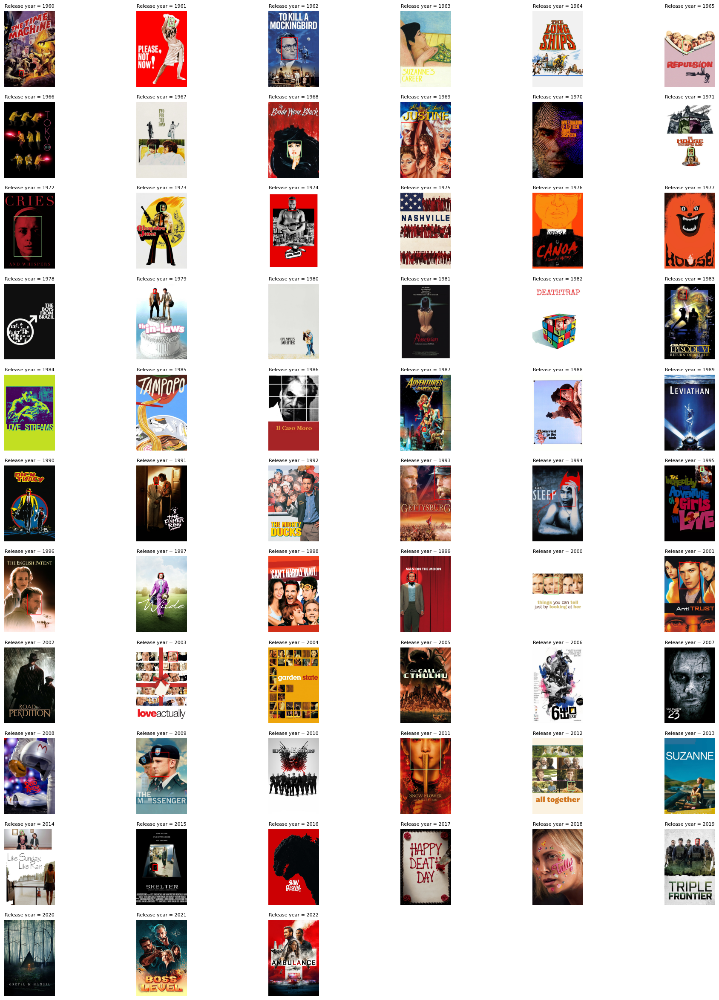

In [48]:
data = (metadata_select2.sort_values("release_year", ascending = True)
        .groupby("release_year")
        .sample(n = 1, random_state = seed)
       )

show_posters_with_main_face(data,
                            poster_folder = poster_folder2,
                            figsize = [24, 30], n_cols = 6, wspace = 0, hspace = 0.2,
                            title = 'year'
                           )

### Analysis over years

In [49]:
data = metadata_select2.groupby(["release_year", "gender"])["id"].count().reset_index()
data[data['release_year']==1970]

,release_year,gender,id
27,1970.0,no face,2
28,1970.0,unknown,1
29,1970.0,woman,1


Warning: there is a problem with the second plot for release year = 1970

In [50]:
data = metadata_select2.groupby(["release_year", "gender"])["id"].count().reset_index()

# Plot
column_labels = {"id": "Number of movies (in %)",
                  "gender": "Gender",
                  "release_year": "Release year"
                 }

px.area(data,
        x = "release_year",
        y = "id",
        color = "gender",
        category_orders = {"gender": ['man', 'woman', 'unknown', 'no face']},
        color_discrete_sequence = px.colors.qualitative.Pastel,
        height = 400,
        groupnorm = "percent",
        labels = column_labels
).show()


# Plot
column_labels = {"id": "Number of movies",
                  "gender": "Gender",
                  "release_year": "Release year"
                 }

px.line(data,
        x = "release_year",
        y = "id",
        color = "gender",
        category_orders = {"gender": ['man', 'woman', 'unknown', 'no face']},
        color_discrete_sequence = px.colors.qualitative.Pastel,
        height = 400,
        labels = column_labels
).show()

In [51]:
metadata_select2

,id,original_title,release_year,bechdel_rating,man,woman,diff,gender,area,area_percentage_relative,rois
2627,874355,Gone in the Night,2022.0,2,0.091466,0.908534,0.817068,woman,510112,1.000000,"{'face_1': {'score': 0.9977015852928162, 'faci..."
2585,865559,Your Christmas Or Mine?,2022.0,3,0.994484,0.005515,0.988969,man,217159,0.555343,"{'face_1': {'score': 0.9997475743293762, 'faci..."
2590,848791,The Stranger,2022.0,3,0.900728,0.099272,0.801456,man,592650,1.000000,"{'face_1': {'score': 0.9992597699165344, 'faci..."
2534,821792,Bull,2021.0,1,0.985348,0.014652,0.970696,man,201630,1.000000,"{'face_1': {'score': 0.9996042847633362, 'faci..."
2568,793723,Sentinelle,2021.0,3,0.599223,0.400777,0.198446,woman,999693,1.000000,"{'face_1': {'score': 0.9993876218795776, 'faci..."
...,...,...,...,...,...,...,...,...,...,...,...
326,85,Raiders of the Lost Ark,1981.0,3,0.976219,0.023781,0.952439,man,141960,0.297244,"{'face_1': {'score': 0.9989423155784607, 'faci..."
1042,83,Open Water,2003.0,1,0.544705,0.455295,0.089411,unknown,10450,0.500815,"{'face_2': {'score': 0.9922425746917725, 'faci..."
1100,74,War of the Worlds,2005.0,3,0.984109,0.015891,0.968218,man,496107,0.681756,"{'face_1': {'score': 0.9989603757858276, 'faci..."
1133,25,Jarhead,2005.0,0,NaN,NaN,NaN,no face,NaN,NaN,NaN
